In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import os

%matplotlib inline
warnings.filterwarnings('ignore')

plt.rcParams['font.family'] = 'NanumGothic'


# 1. 데이터셋

In [22]:
import FinanceDataReader as fdr

In [23]:
# 삼성전자 주식코드: 005930
STOCK_CODE = '005930'

stock = fdr.DataReader(STOCK_CODE)

In [24]:

stock['Year'] = stock.index.year
stock['Month'] = stock.index.month
stock['Day'] = stock.index.day

In [25]:
stock.head()

,Open,High,Low,Close,Volume,Change,Year,Month,Day
Date,,,,,,,,,
1998-03-12,1606,1666,1588,1609,306558,NaN,1998,3,12
1998-03-13,1608,1608,1515,1579,247920,-0.018645,1998,3,13
1998-03-14,1525,1579,1525,1543,82450,-0.022799,1998,3,14
1998-03-16,1543,1577,1541,1543,143731,0.000000,1998,3,16
1998-03-17,1525,1534,1470,1485,233223,-0.037589,1998,3,17


Text(0, 0.5, 'price')

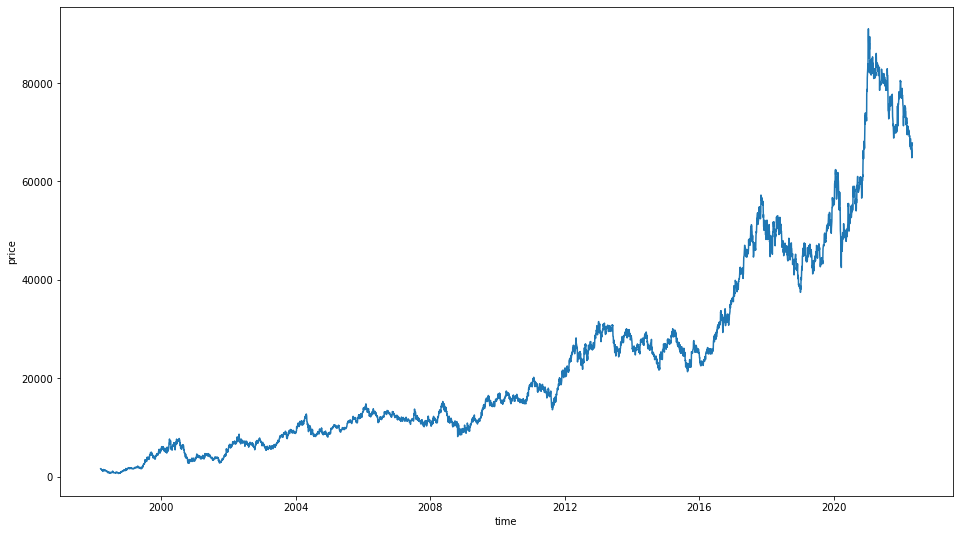

In [26]:
plt.figure(figsize=(16, 9)) # 그래프 사이즈
sns.lineplot(y=stock['Close'], x=stock.index) # 차트 종류 및 x, y축
plt.xlabel('time')
plt.ylabel('price')

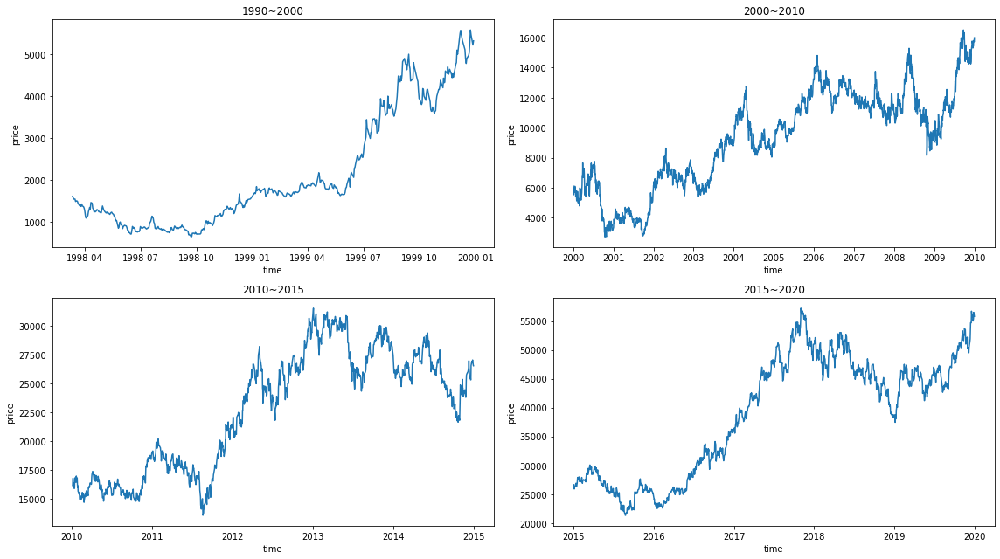

In [27]:
time_steps = [['1990', '2000'], 
              ['2000', '2010'], 
              ['2010', '2015'], 
              ['2015', '2020']]

fig, axes = plt.subplots(2, 2)
fig.set_size_inches(16, 9)

for i in range(4):
    ax = axes[i//2, i%2]
    df = stock.loc[(stock.index > time_steps[i][0]) & (stock.index < time_steps[i][1]), :]
    sns.lineplot(y=df['Close'], x=df.index, ax=ax)
    ax.set_title(f'{time_steps[i][0]}~{time_steps[i][1]}')
    ax.set_xlabel('time')
    ax.set_ylabel('price')
plt.tight_layout()
plt.show()

In [28]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
# 스케일을 적용할 column을 정의합니다.
scale_cols = ['Open', 'High', 'Low', 'Close', 'Volume']
# 스케일 후 columns
scaled = scaler.fit_transform(stock[scale_cols])
scaled

array([[0.01778516, 0.01721074, 0.01774302, 0.01074567, 0.00339465],
       [0.01780731, 0.01661157, 0.01692737, 0.01041367, 0.00274533],
       [0.01688815, 0.01631198, 0.01703911, 0.01001527, 0.00091301],
       ...,
       [0.72093023, 0.69834711, 0.72625698, 0.73882827, 0.2900177 ],
       [0.73754153, 0.69834711, 0.74301676, 0.73772161, 0.15620398],
       [0.74640089, 0.70661157, 0.75195531, 0.74325491, 0.14487116]])

In [29]:
df = pd.DataFrame(scaled, columns=scale_cols)

# 이 전까지 되어 있는 것
1. feature selection
2. 정규화




# 2. 모델링

In [30]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(df.drop('Close', 1), df['Close'], test_size=0.2, random_state=0, shuffle=False)

print(x_train.shape, y_train.shape, x_test.shape, y_test.shape)

(4800, 4) (4800,) (1200, 4) (1200,)


In [31]:
import tensorflow as tf

In [32]:
def windowed_dataset(series, window_size, batch_size, shuffle):
    series = tf.expand_dims(series, axis=-1) # 배열의 차원을 늘려준다. axis->몇 번째 차원의 크기를 늘릴 것인가. 이 경우 가장 안쪽 차원을 늘려 줌(기존: (4800,)->(4800,1))
    ds = tf.data.Dataset.from_tensor_slices(series) # 데이터셋 생성
    ds = ds.window(window_size + 1, shift=1, drop_remainder=True) 
    '''
    window=원소집합. windows의 데이터셋을 return한다. winodw_size+1인 이유는 아마도 y까지 포함했기 때문으로 생각됨(확인 필요)
    인자
    - size: 각 window의 원소 개수
    - shift: 각 window의 첫 번째 원소가 이전 window 첫 번째 원소의 shift배한 값
    - stride: window내 원소의 간격
    - drop_remainder: default=False. 개수가 적어 window를 구성하지 못하면 남은 원소 삭제 
    - name: A name for the tf.data operation.
    '''

    ds = ds.flat_map(lambda w : w.batch(window_size + 1))
    
    
    if shuffle:
        ds = ds.shuffle(1000)
    
    ds = ds.map(lambda w: (w[:-1], w[-1])) # 각 튜플 안에 x와 y가 각각 array 형식으로 저장
 
    return ds.batch(batch_size).prefetch(1)

In [33]:
WINDOW_SIZE=20
BATCH_SIZE=32

In [34]:
# trian_data는 학습용 데이터셋, test_data는 검증용 데이터셋 입니다.
train_data = windowed_dataset(y_train, WINDOW_SIZE, BATCH_SIZE, True)
test_data = windowed_dataset(y_test, WINDOW_SIZE, BATCH_SIZE, False)

In [15]:
for i in train_data:
    print(i)

(<tf.Tensor 'IteratorGetNext:0' shape=(?, ?, 1) dtype=float64>, <tf.Tensor 'IteratorGetNext:1' shape=(?, 1) dtype=float64>)
(<tf.Tensor 'IteratorGetNext_1:0' shape=(?, ?, 1) dtype=float64>, <tf.Tensor 'IteratorGetNext_1:1' shape=(?, 1) dtype=float64>)
(<tf.Tensor 'IteratorGetNext_2:0' shape=(?, ?, 1) dtype=float64>, <tf.Tensor 'IteratorGetNext_2:1' shape=(?, 1) dtype=float64>)
(<tf.Tensor 'IteratorGetNext_3:0' shape=(?, ?, 1) dtype=float64>, <tf.Tensor 'IteratorGetNext_3:1' shape=(?, 1) dtype=float64>)
(<tf.Tensor 'IteratorGetNext_4:0' shape=(?, ?, 1) dtype=float64>, <tf.Tensor 'IteratorGetNext_4:1' shape=(?, 1) dtype=float64>)
(<tf.Tensor 'IteratorGetNext_5:0' shape=(?, ?, 1) dtype=float64>, <tf.Tensor 'IteratorGetNext_5:1' shape=(?, 1) dtype=float64>)
(<tf.Tensor 'IteratorGetNext_6:0' shape=(?, ?, 1) dtype=float64>, <tf.Tensor 'IteratorGetNext_6:1' shape=(?, 1) dtype=float64>)
(<tf.Tensor 'IteratorGetNext_7:0' shape=(?, ?, 1) dtype=float64>, <tf.Tensor 'IteratorGetNext_7:1' shape=(?,

KeyboardInterrupt: 

In [16]:
# 아래의 코드로 데이터셋의 구성을 확인해 볼 수 있습니다.
# X: (batch_size, window_size, feature)
# Y: (batch_size, feature)
for data in train_data.take(1):
    print(f'데이터셋(X) 구성(batch_size, window_size, feature갯수): {data[0].shape}') # data[0] -> x
    print(f'데이터셋(Y) 구성(batch_size, window_size, feature갯수): {data[1].shape}') # data[1] -> y

데이터셋(X) 구성(batch_size, window_size, feature갯수): (?, ?, 1)
데이터셋(Y) 구성(batch_size, window_size, feature갯수): (?, 1)
데이터셋(X) 구성(batch_size, window_size, feature갯수): (?, ?, 1)
데이터셋(Y) 구성(batch_size, window_size, feature갯수): (?, 1)
데이터셋(X) 구성(batch_size, window_size, feature갯수): (?, ?, 1)
데이터셋(Y) 구성(batch_size, window_size, feature갯수): (?, 1)
데이터셋(X) 구성(batch_size, window_size, feature갯수): (?, ?, 1)
데이터셋(Y) 구성(batch_size, window_size, feature갯수): (?, 1)
데이터셋(X) 구성(batch_size, window_size, feature갯수): (?, ?, 1)
데이터셋(Y) 구성(batch_size, window_size, feature갯수): (?, 1)
데이터셋(X) 구성(batch_size, window_size, feature갯수): (?, ?, 1)
데이터셋(Y) 구성(batch_size, window_size, feature갯수): (?, 1)
데이터셋(X) 구성(batch_size, window_size, feature갯수): (?, ?, 1)
데이터셋(Y) 구성(batch_size, window_size, feature갯수): (?, 1)
데이터셋(X) 구성(batch_size, window_size, feature갯수): (?, ?, 1)
데이터셋(Y) 구성(batch_size, window_size, feature갯수): (?, 1)
데이터셋(X) 구성(batch_size, window_size, feature갯수): (?, ?, 1)
데이터셋(Y) 구성(batch_size, window_size, fe

KeyboardInterrupt: 

In [35]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Conv1D, Lambda
from tensorflow.keras.losses import Huber
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

In [36]:
model = Sequential() # 레이어를 선형으로 연결하여 구성. layer 인스턴스를 생성자에게 넘겨줌
model.add(Conv1D(filters=32, kernel_size=5,
           padding="causal",
           activation="relu",
           input_shape=[WINDOW_SIZE, 1]))
model.add(LSTM(16, activation='tanh'))
model.add(Dense(16, activation='relu'))
model.add(Dense(1))

In [37]:
# Sequence 학습에 비교적 좋은 퍼포먼스를 내는 Huber()를 사용합니다.
loss = Huber()
optimizer = Adam(0.0005)
model.compile(loss=Huber(), optimizer=optimizer, metrics=['mse'])

In [38]:
# earlystopping은 10번 epoch통안 val_loss 개선이 없다면 학습을 멈춥니다.
earlystopping = EarlyStopping(monitor='val_loss', patience=10)
# val_loss 기준 체크포인터도 생성합니다.
filename = os.path.join('tmp', 'ckeckpointer.ckpt')
checkpoint = ModelCheckpoint(filename, 
                             save_weights_only=True, 
                             save_best_only=True, 
                             monitor='val_loss', 
                             verbose=1)

In [39]:
history = model.fit(train_data, 
                    validation_data=(test_data), 
                    epochs=50, 
                    callbacks=[checkpoint, earlystopping])

TypeError: 'DatasetV1Adapter' object is not subscriptable

In [125]:
pred = model.predict(test_data)
pred.shape
plt.figure(figsize=(12, 9))
plt.plot(np.asarray(y_test)[20:], label='actual')
plt.plot(pred, label='prediction')
plt.legend()
plt.show()


(1180, 1)